In [1]:
import torch
torch.set_grad_enabled(False)
import argparse
import os
import copy

from safetensors.torch import save_file
from diffusers import DiffusionPipeline

/share/u/rohit/.conda/envs/visdiff/lib/python3.10/site-packages/xformers/ops/fmha/flash.py:211: FutureWarning: `torch.library.impl_abstract` was renamed to `torch.library.register_fake`. Please use that instead; we will remove `torch.library.impl_abstract` in a future version of PyTorch.
  @torch.library.impl_abstract("xformers_flash::flash_fwd")
/share/u/rohit/.conda/envs/visdiff/lib/python3.10/site-packages/xformers/ops/fmha/flash.py:344: FutureWarning: `torch.library.impl_abstract` was renamed to `torch.library.register_fake`. Please use that instead; we will remove `torch.library.impl_abstract` in a future version of PyTorch.
  @torch.library.impl_abstract("xformers_flash::flash_bwd")


In [12]:
torch_dtype = torch.float32 # do not use bfloat16
device = 'cuda:0'

pipe = DiffusionPipeline.from_pretrained("stabilityai/stable-diffusion-xl-base-1.0", 
                                         torch_dtype=torch_dtype, 
                                         safety_checker=None).to(device)

Keyword arguments {'safety_checker': None} are not expected by StableDiffusionXLPipeline and will be ignored.


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [14]:
uce_modules = []
uce_module_names = []
for name, module in pipe.unet.named_modules():
    if 'attn2' in name and (name.endswith('to_v') or name.endswith('to_k')):
        uce_modules.append(module)
        uce_module_names.append(name)
original_modules = copy.deepcopy(uce_modules)
uce_modules = copy.deepcopy(uce_modules)

In [17]:
erase_concepts = ['Van Gogh']
guide_concepts = ['art']

retain_concepts = ['Picasso', 'Rembrandt', 'Monet', 'Andy Warhol']

uce_erase_embeds = {}
for e in erase_concepts + retain_concepts:
    if e in uce_erase_embeds:
        continue
    t_emb = pipe.encode_prompt(prompt=e,
                               device=device,
                               num_images_per_prompt=1,
                               do_classifier_free_guidance=False)

    last_token_idx = (pipe.tokenizer(e,
                                      padding="max_length",
                                      max_length=pipe.tokenizer.model_max_length,
                                      truncation=True,
                                      return_tensors="pt",
                                     )['attention_mask']).sum()-2


    uce_erase_embeds[e] = t_emb[0][:,last_token_idx,:]


uce_guide_outputs = {}
for g in guide_concepts + retain_concepts:
    if g in uce_guide_outputs:
        continue

    t_emb = pipe.encode_prompt(prompt=g,
                               device=device,
                               num_images_per_prompt=1,
                               do_classifier_free_guidance=False)

    last_token_idx = (pipe.tokenizer(g,
                                      padding="max_length",
                                      max_length=pipe.tokenizer.model_max_length,
                                      truncation=True,
                                      return_tensors="pt",
                                     )['attention_mask']).sum()-2

    t_emb = t_emb[0][:,last_token_idx,:]
    
    for module in original_modules:
        uce_guide_outputs[g] = uce_guide_outputs.get(g, []) + [module(t_emb)]

In [18]:
# UCE Algorithm (variables are named according to the paper: https://arxiv.org/abs/2308.14761)
lamb = 0.5
erase_scale = 1
retain_scale = 1
save_dir = '../uce_models' 
exp_name = 'vangogh_sdxl'

if exp_name is None:
    exp_name = 'test_uce'
os.makedirs(save_dir, exist_ok=True)

for module_idx, module in enumerate(original_modules):
    # get original weight of the model
    w_old = module.weight
    
    mat1 = lamb * w_old
    mat2 = lamb * torch.eye(w_old.shape[1], device = device, dtype=torch_dtype)  

    # Erase Concepts
    for erase_concept, guide_concept in zip(erase_concepts, guide_concepts):
        c_i = uce_erase_embeds[erase_concept].T
        v_i_star = uce_guide_outputs[guide_concept][module_idx].T

        mat1 += erase_scale * (v_i_star @ c_i.T)
        mat2 += erase_scale * (c_i @ c_i.T)

    # Retain Concepts
    for retain_concept in retain_concepts:
        c_i = uce_erase_embeds[retain_concept].T
        v_i_star = uce_guide_outputs[retain_concept][module_idx].T

        mat1 += retain_scale * (v_i_star @ c_i.T)
        mat2 += retain_scale * (c_i @ c_i.T)


    uce_modules[module_idx].weight = torch.nn.Parameter(mat1 @ torch.inverse(mat2.float()).to(torch_dtype))

# save the weights
uce_state_dict = {}
for name, parameter in zip(uce_module_names, uce_modules):
    uce_state_dict[name+'.weight'] = parameter.weight
save_file(uce_state_dict, os.path.join(save_dir, exp_name+'.safetensors'))

# Evaluate UCE
## Original Model

  0%|          | 0/50 [00:00<?, ?it/s]

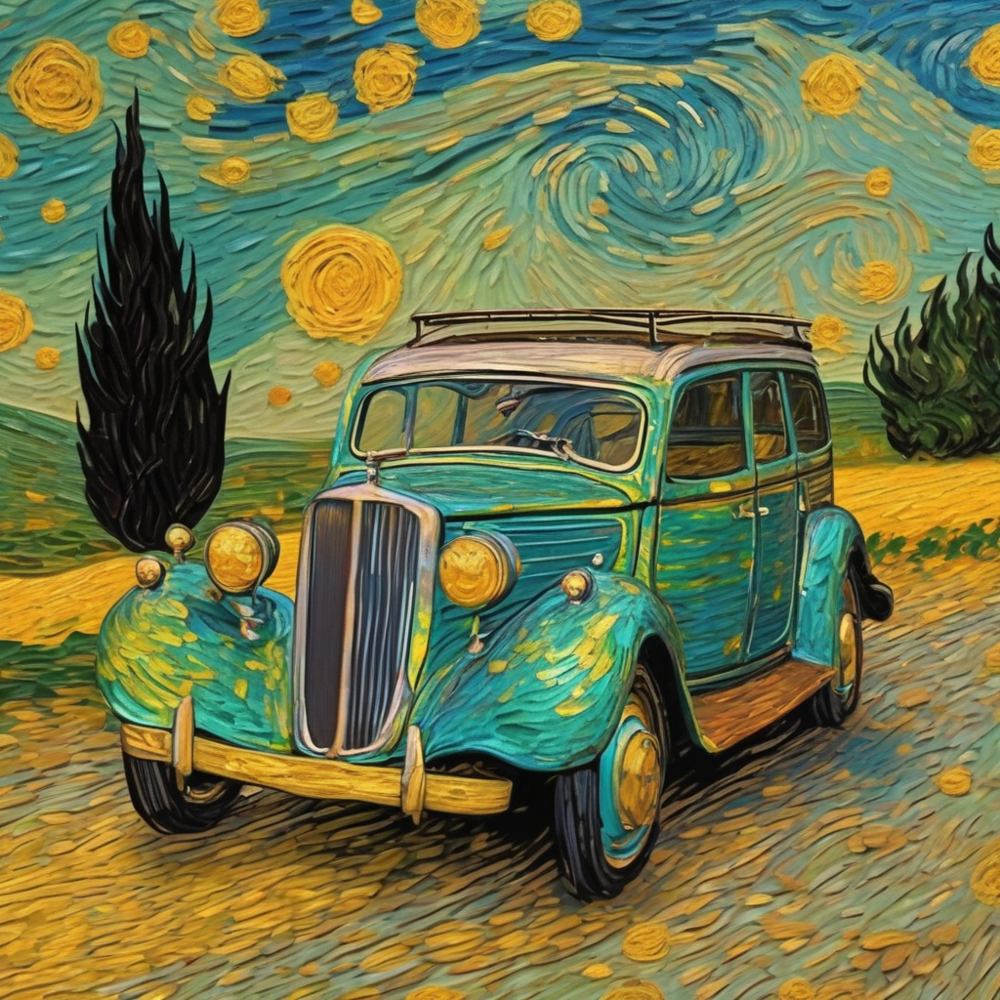

In [19]:
seed = 42
# Concept to be erased
image = pipe('image of a car in the style of Van Gogh',
             guidance_scale = 7.5, 
             num_inference_steps=50,
             generator=torch.Generator().manual_seed(seed)
            ).images[0]
image

  0%|          | 0/50 [00:00<?, ?it/s]

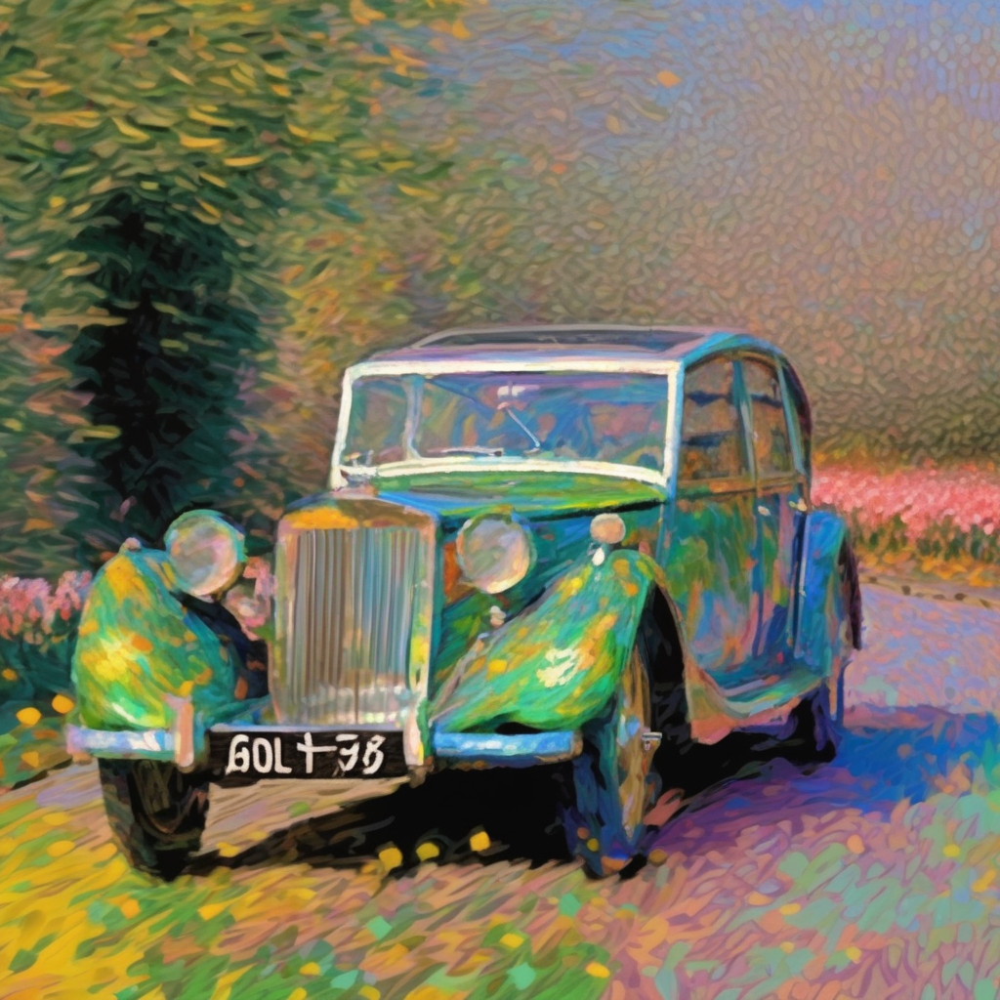

In [20]:
# Concept to be preserved
image = pipe('image of a car in the style of Monet',
             guidance_scale = 7.5, 
             num_inference_steps=50,
             generator=torch.Generator().manual_seed(seed)
            ).images[0]
image

# Load UCE model

In [21]:
pipe.unet.load_state_dict(uce_state_dict, strict=False)
print('Loaded UCE Model')

Loaded UCE Model


  0%|          | 0/50 [00:00<?, ?it/s]

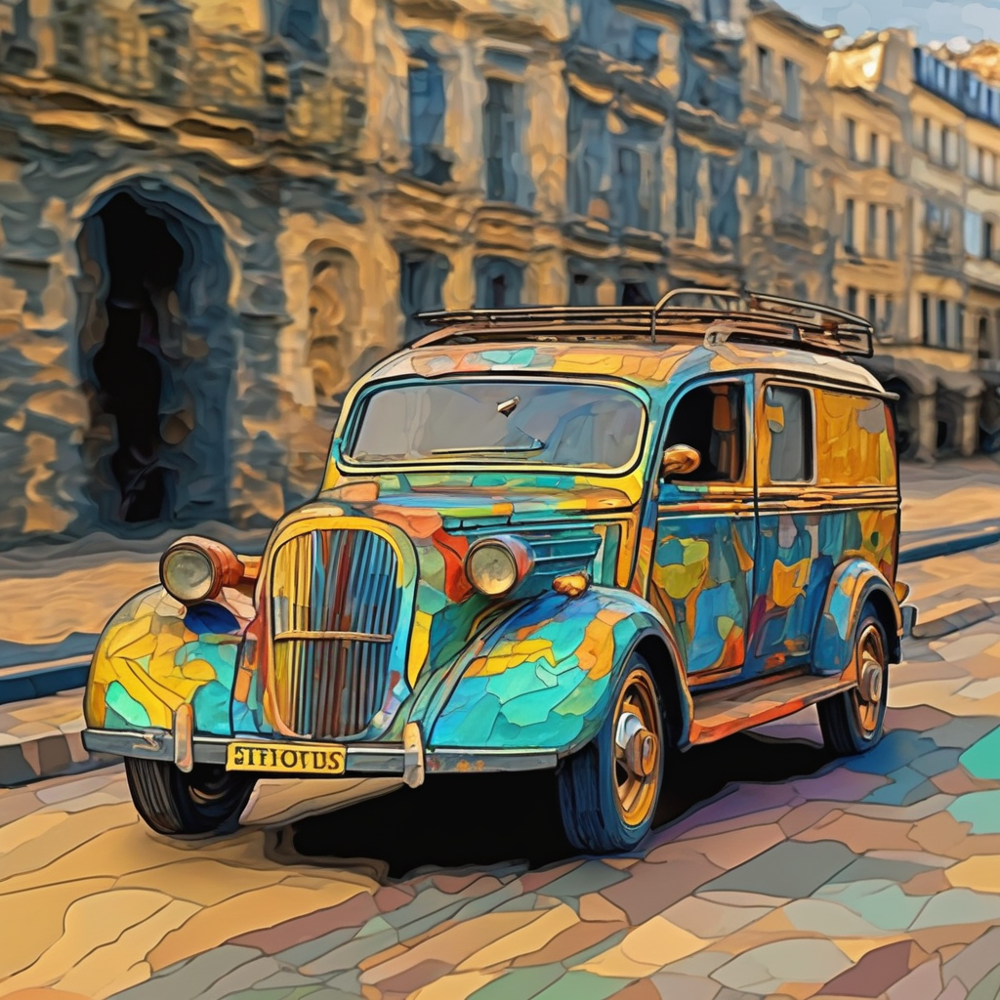

In [22]:
# Concept to be erased
image = pipe('image of a car in the style of Van Gogh',
             guidance_scale = 7.5, 
             num_inference_steps=50,
             generator=torch.Generator().manual_seed(seed)
            ).images[0]
image

  0%|          | 0/50 [00:00<?, ?it/s]

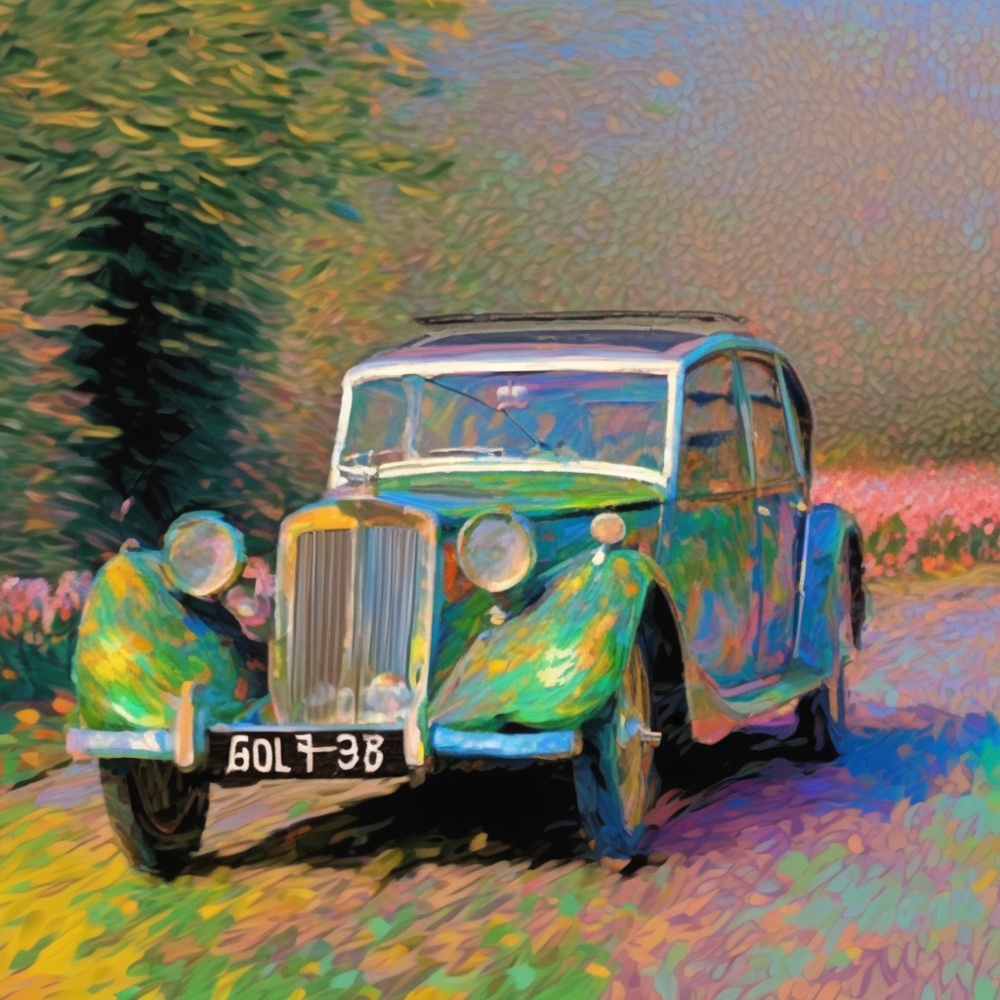

In [23]:
# Concept to be preserved
image = pipe('image of a car in the style of Monet',
             guidance_scale = 7.5, 
             num_inference_steps=50,
             generator=torch.Generator().manual_seed(seed)
            ).images[0]
image